In [2]:
#Basic Python and Machine learning libraries
import os, sys, warnings, random, time, re, math, string, copy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import json
from string import punctuation
from collections import Counter,defaultdict
from re import search
from scipy import stats

from wordcloud import WordCloud, STOPWORDS

from sklearn import metrics
from sklearn.model_selection import StratifiedKFold

from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS as sklearn_stop_words
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel

# sklearn data science models
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression, SGDClassifier, Lasso
from sklearn.svm import LinearSVC
import xgboost as xgb

from bs4 import BeautifulSoup

import nltk

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize
from nltk.stem import SnowballStemmer, WordNetLemmatizer
from nltk.tokenize.casual import casual_tokenize
from nltk.util import ngrams

import spacy

warnings.filterwarnings('ignore')

#tqdm with pandas
from tqdm import tqdm
tqdm.pandas()
from collections import Counter

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
from preprocess_utils import *

In [4]:
fname = '/content/drive/MyDrive/intern-unsw/assets/upnishads_texts/108upanishads.txt'
with open(fname, 'r', encoding='utf-8-sig') as f:
  data = f.read()
  f.close()

In [5]:
def veda_to_upanishads(raw_data):
  '''
  get the names of all 108 upanishads from raw data
  Args:
    raw_data: unprocessed data
  Return:
    all_upanishads: dictioanry with vedas name as key and upanishads list as values
  '''
  raw_data = raw_data.replace('\x0c', '')#remove unicode
  raw_data = raw_data.replace('*', '')#remove asterics
  data_split_newline = raw_data.split('\n')
  
  veda_to_upanishads = defaultdict(list)

  
  all_upanishads_rig_ = [x for x in data_split_newline[33880:33891]]
  all_upanishads_syv_ = [x for x in data_split_newline[33893:33912]]
  all_upanishads_kyv_ = [x for x in data_split_newline[33914:33947]]
  all_upanishads_sam_ = [x for x in data_split_newline[33949:33965]]
  all_upanishads_ath_ = [x for x in data_split_newline[33967:33999]]


  #Rig Veda
  for i, name in enumerate(all_upanishads_rig_):
    if len(name) > 0:
      name = name.strip().split(' ')[1] 
      veda_to_upanishads["Rig-Veda"].append(name)
  #Sukla_yajur_veda

  for i, name in enumerate(all_upanishads_syv_):
    if len(name) > 0:
      name = name.strip().split(' ')[1] 
      veda_to_upanishads["Sukla-Yajur-Veda"].append(name)
  # Krishna-Yajur-Veda

  for i, name in enumerate(all_upanishads_kyv_):
    if len(name) > 0:
      name = name.strip().split(' ')[1] 
      veda_to_upanishads["Krishna-Yajur-Veda"].append(name)
  # Sama-Veda

  for i, name in enumerate(all_upanishads_sam_):
    if len(name) > 0:
      name = name.strip().split(' ')[1] 
      veda_to_upanishads["Sama-Veda"].append(name)

  # Atharva-Veda
  for i, name in enumerate(all_upanishads_ath_):
    if len(name) > 0:
      name = name.strip().split(' ')[1] 
      veda_to_upanishads["Atharva-Veda"].append(name)
  return veda_to_upanishads
##Create dictionary for each Upanishads
veda_upanishads = veda_to_upanishads(data)
# veda_upanishads

In [6]:
def get_upanishads_names(raw_data):
  '''
  get the names of all 108 upanishads from raw data
  Args:
    raw_data: unprocessed data
  Return:
    all_upanishads: list of all 108 upanishads
  '''
  raw_data = raw_data.replace('\x0c', '')#remove unicode
  raw_data = raw_data.replace('*', '')#
  data_split_newline = raw_data.split('\n')
  
  all_upanishads = []
  all_upanishads_ = [x for x in data_split_newline[16:128]]

  for i, name in enumerate(all_upanishads_):
    if len(name) > 0 and "Followed by" not in name:
      name = name.strip().split(' ')[1] 
      all_upanishads.append(name)
  return all_upanishads
##Create dictionary for each Upanishads
all_upanishads = get_upanishads_names(data)
# len(all_upanishads)

In [7]:
# re.findall(r"End of .*Commentary", data)
# re.findall(r"(Here ends the .*panishad.*Veda\.)", data)

In [8]:
def create_upanishads_dict(raw_data):
  '''
  Create a dictionary for each Upanished contained with texts 
  '''
  # all_upanishads = get_upanishads_names(raw_data)
  # print(len(all_upanishads))
  raw_data = data.replace('\x0c', '')
  all_match = re.findall(r"(Here ends the .*panishad.*Veda\.)", raw_data)

  #both part contais the explanation of same upanishad so combine them
  #all_match.remove('Here ends the Mandukyopanishad, included in the Atharva-Veda.')
  all_match.remove('Here ends the Mandukyopanishad, as contained in the Atharva-Veda.')
  all_match.remove('Here ends the Nrisimha Poorva Tapaniyopanishad, as contained in the Atharva-Veda.')
  #print(len(all_match))
  #some text contains commentry by Swami Nirmalananda Giri
  #print(len(all_upanishads),len(all_match))
  commentary_list = re.findall(r"End of .*Commentary", raw_data)

  upan_dict = {}
  start_idx = raw_data.find("Isavasya Upanishad");

  for idx , match in enumerate(all_match):
    upan = match.strip().split(" ")[3]
    #upan = all_upanishads[idx]
    # print(upan, ":", match)
    if upan.endswith(","):
      upan = upan[:-1]#remove comma in the end
    #print(upan)
    end_idx = raw_data.find(all_match[idx])

    #first 10 upanishads contains commentary
    if idx < 10:
      end_idx = raw_data.find(commentary_list[idx])
      upan_dict[upan] = r"{}".format(raw_data[start_idx:end_idx+len(commentary_list[idx])])
      start_idx = end_idx+len(commentary_list[idx])+1
    else:
      upan_dict[upan] = r"{}".format(raw_data[start_idx:end_idx+len(match)])
      start_idx = end_idx+len(match)+1
    # if upan == 'Mandukyopanishad':
    #   print(upan_dict[upan])
  return upan_dict
upan_dict = create_upanishads_dict(data)

In [9]:
def rename_keys_upanishad_dict(new_key_list, upanishad_dict):
  '''
  rename keys to simple names of upanishads
  return:
      upanishad dict with renamed keys
  '''
  upanishad_dict = dict(zip(new_key_list,list(upanishad_dict.values())))

  return upanishad_dict

new_upan_dict = rename_keys_upanishad_dict(all_upanishads, upan_dict)

In [10]:
with open('all_upanishads.json', 'w') as fp:
    json.dump(new_upan_dict, fp,indent=4)

In [11]:
def remove_beginning_lines(data):
  """
  Remove the beginning lines, like translated by, published by, and upanishads name
  """
  data_list = data.split('\n')
  
  data_list = [x for x in data_list if len(x)> 0]
  
  data_list = data_list[1:]#remove name of the upanishads
  
  if "Translated by" in data_list[0]:
    data_list = data_list[1:]
  if "Published by" in data_list[0]:
    data_list = data_list[1:]

  data = "\n".join(data_list)
  
  return data

def replace_words_contraction(data, map_old_new, contraction_map):
  """
  Replace old and archaic words
  """
  for new_old, word in zip(map_old_new.keys(), contraction_map.keys()):
    data = data.replace(new_old, map_old_new[new_old])
    data = data.replace(word, contraction_map[word])
  return data

# data_removed_begin = remove_beginning_lines(new_upan_dict['Isa'])
# print(data_removed_begin)
text = new_upan_dict['Isa']

In [12]:
def lemmatize_sentence(sentence):
  """
  Lemmatize a single sentence
  """
  token_words=word_tokenize(sentence)
  lemma_sentence=[]
  lemmatizer = WordNetLemmatizer()
  for word in token_words:
    lemma_sentence.append(lemmatizer.lemmatize(word))
    lemma_sentence.append(" ")
  return "".join(lemma_sentence)

def lemmatize_doc(data):
  """
  Lemmatize entire documents
  """
  data_list = data.split('\n')
  
  data_list = [x for x in data_list if len(x)> 0]
  lametized_list = []
  for sentence in data_list:
    lam_sent = lemmatize_sentence(sentence)
    lametized_list.append(lam_sent)

  lametized_list = [x for x in lametized_list if len(x)> 0]
  data = "\n".join(lametized_list)
  
  return data

In [13]:
def clean_text(data):
  '''
  clean the raw text of each of the 108 upanishads
  '''
  #remove unicode
  data = data.replace('\x0c', '')

  #removes beginning line eg. Upanishad's name, translated by and published by
  data = remove_beginning_lines(data)

  #remove sloka's numbering eg. 2-III-11.,I-3:,10.etc
  data = re.sub('(.*[-][\d]+[.:])|(^[\d]+[.])', '', data)

  #remove the numbering of upanishads eg. (Atharvashikha Upanishad 1:10)
  data = re.sub('[(](?<=\()(.*? Upanishad .*?)(?=\))[)]', '', data)

  #remove the numbering of upanishads eg. (2:10)
  data = re.sub('[(](?<=\()([0-9]+:[0-9]+)(?=\))[)]', '', data)

  #remove the numberings eg. II-ii-51-56., II-21.
  data = re.sub("(.*[-][\d]+[.:])|(^[\d]+[.])|(.*[-][\d]+([a-z()]{3})[.:])", '', data)

  #remove and replace different symbols and repetitive characters
  data = data.replace('…………………', '')
  data = data.replace('………..', '')
  data = data.replace('……', '')
  data = data.replace('....', '')
  data = data.replace('...', '')
  data = data.replace('..', '')

  #replace texts
  data = data.replace('Om!', 'Om ')
  data = data.replace('Om !', 'Om')
  data = data.replace('Om! Peace! Peace! Peace!', 'Om Peace Peace Peace!')

  #remove extra texts like commentary by ...
  data = re.sub('.*by Swami Nirmalananda Giri.', '', data)
  data = re.sub(r"End of .*Commentary", '', data)
  
  #eg. Isha Upanishad commentary
  data = re.sub(".*panishad Commentary", '', data)

  #remove archaic words like thy thou etc
  data = replace_words_contraction(data, map_old_new, contraction_mapping)

  # remove all other symbols numbers and white spaces
  data = "".join([character if (character.isalpha() or character == "." or character ==" " or character == "\n") else " " for character in data])
  
  # remove line break and break based on full stops to make documents
  data = data.replace("\n", " ")

  data_list = data.split(".")
  data_list = [x for x in data_list if (len(x.strip().split(" ")) > 3)]

  data = "\n".join(data_list)

  #remove extra spaces 
  data = re.sub(" +", " ", data)

  #lower case
  data = data.lower()
  
  #lametization
  data = lemmatize_doc(data)
  
  return data

In [14]:
# text_cleaned = clean_text(text)
# data_lemmat = lemmatize_doc(text_cleaned)
# print(data_lemmat)
# stopwrds = stopwords.words('english')
# print(stopwords.words('english'))

In [15]:
def get_cleaned_data_dict(data):
  """
  dict of Cleaned data
  """
  all_upanishads = get_upanishads_names(data)
  upan_dict = create_upanishads_dict(data)
  new_upan_dict = rename_keys_upanishad_dict(all_upanishads, upan_dict)

  cleaned_upanishads_dict = {}
  for upanishads_name in new_upan_dict.keys():
    cleaned_upanishads_dict[upanishads_name] = clean_text(new_upan_dict[upanishads_name])
  
  return cleaned_upanishads_dict

def save_cleaned_data_as_json(data):
  cleaned_upanishads = get_cleaned_data_dict(data)
  with open('all_upanishads_cleaned.json', 'w') as fp:
    json.dump(cleaned_upanishads_dict, fp, indent=4)

cleaned_upanishads = get_cleaned_data_dict(data)

In [16]:
def join_upanishads(data, num):
  cleaned_upanishads = get_cleaned_data_dict(data)
  top_num_upanishads = []
  for idx, name in enumerate(cleaned_upanishads.keys()):
    if idx < num:
      top_num_upanishads.append(cleaned_upanishads[name])
  
  top_num_upanishads_ = "\n".join(top_num_upanishads)
  return top_num_upanishads_
top_twelve_upanishads = join_upanishads(data, 12)

In [17]:
len(top_twelve_upanishads.split("\n"))

13120

# Topic modelling using Top2vec

In [ ]:
!pip install top2vec
!pip install top2vec[sentence_encoders]
!pip install top2vec[sentence_transformers]
!pip install plotly==5.2.1

In [18]:
from top2vec import Top2Vec
import umap
import hdbscan

In [19]:
def get_topics_model(documents, embedding_model='universal-sentence-encoder', num_topics = 10):
  """
  Returns model and topics
  embedding_models: `universal-sentence-encoder`
                    `universal-sentence-encoder_-multilingual`
                    `distiluse-base-multilingual-cased`
  """
  model = Top2Vec(documents= documents, speed='learn', workers=8, min_count = 2, embedding_model=embedding_model)
  if model.get_num_topics() > num_topics:
    topic_words, word_scores, topic_nums = model.get_topics(num_topics)
  else:
    topic_words, word_scores, topic_nums = model.get_topics()
  return model, topic_words, word_scores 

In [20]:
def get_words(model, num_words = 20, num_topics = 10):
  """
  get n random words from each topics
  """
  
  if model.get_num_topics() < num_topics:
    num_topics = model.get_num_topics()

  #####reduce topics######################
  reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_topics)

  topic_words, word_scores, topic_nums = model.get_topics(reduced=True)
  return topic_words[:,:num_words]

In [21]:
model = Top2Vec(documents= top_twelve_upanishads.split("\n"), speed='learn', workers=8, min_count = 2, embedding_model='universal-sentence-encoder')

2021-08-20 09:10:01,887 - top2vec - INFO - Pre-processing documents for training
2021-08-20 09:10:03,349 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:absl:Using /tmp/tfhub_modules to cache modules.
INFO:absl:Downloading TF-Hub Module 'https://tfhub.dev/google/universal-sentence-encoder/4'.
INFO:absl:Downloading https://tfhub.dev/google/universal-sentence-encoder/4: 870.00MB
INFO:absl:Downloaded https://tfhub.dev/google/universal-sentence-encoder/4, Total size: 987.47MB
INFO:absl:Downloaded TF-Hub Module 'https://tfhub.dev/google/universal-sentence-encoder/4'.
2021-08-20 09:10:27,214 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2021-08-20 09:10:30,698 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2021-08-20 09:11:17,928 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
20

In [22]:
topic_words, word_scores, topic_nums = model.get_topics()
# topic_words.shape
# print(topic_words[1],word_scores[1])
# model.get_num_topics()
# random.sample(list(topic_words[0]), 20)
print(model.get_num_topics())

113


In [23]:
topic_words.shape

(113, 50)

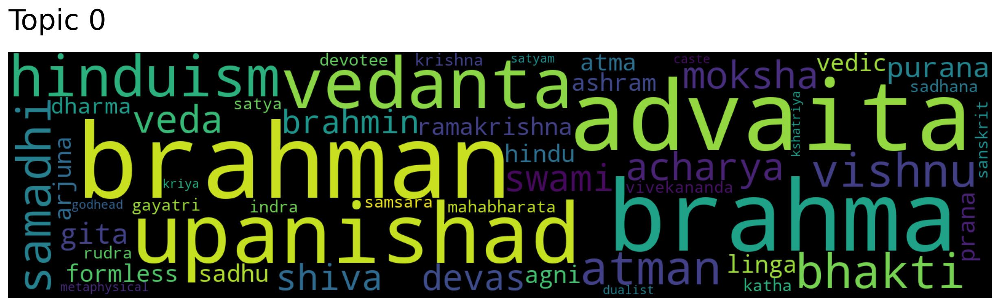

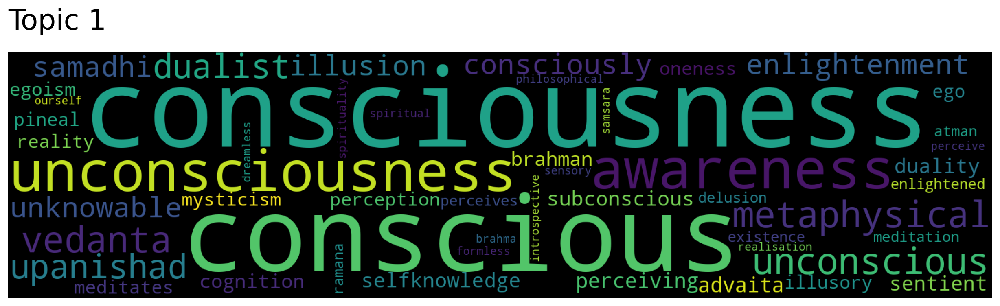

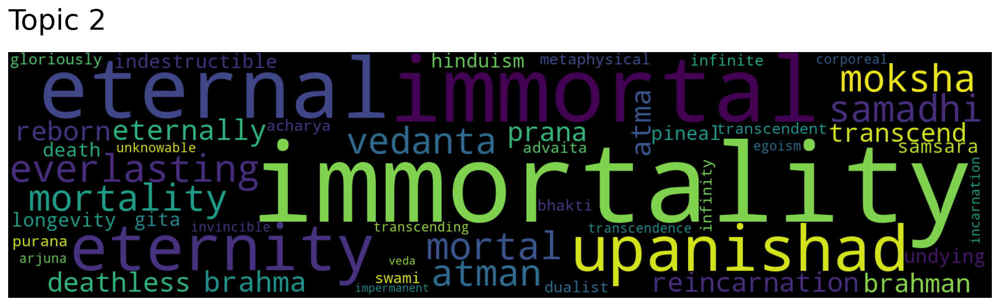

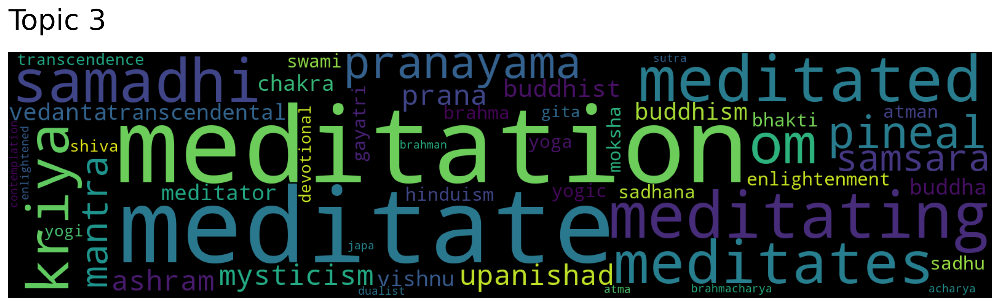

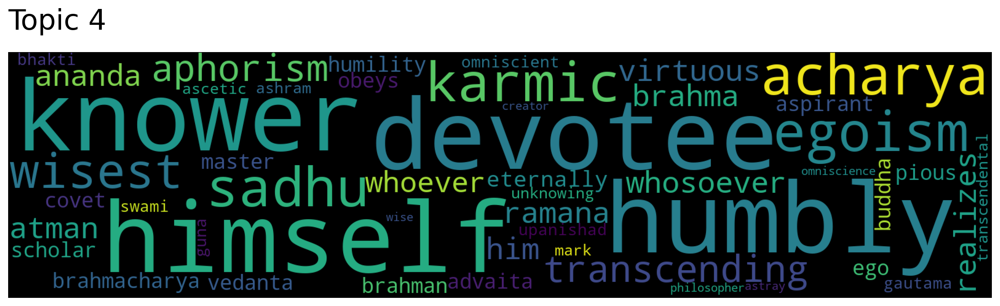

...

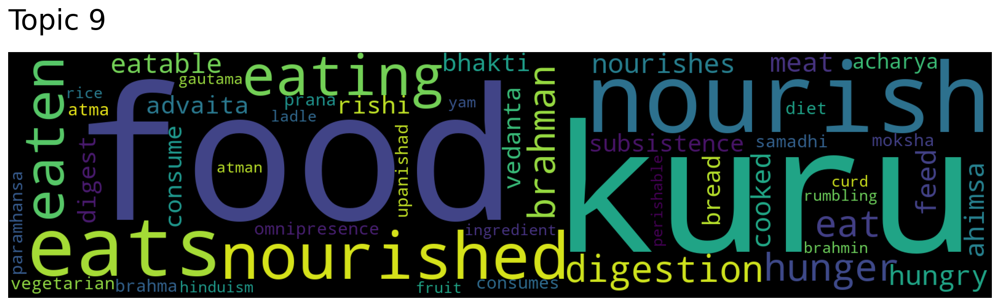

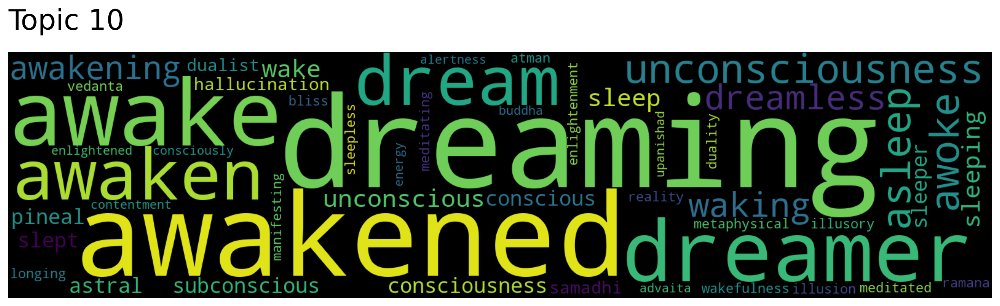

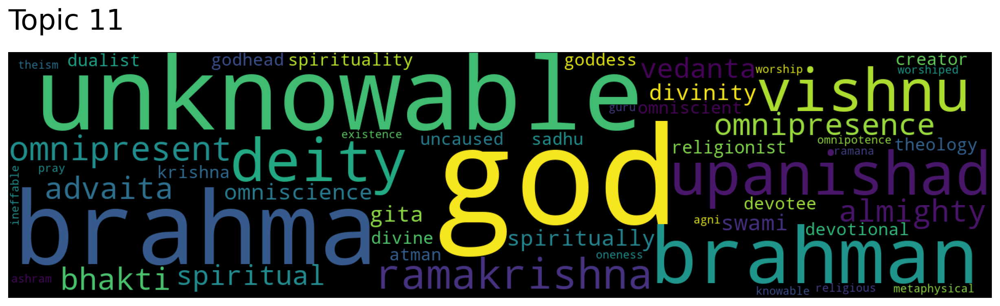

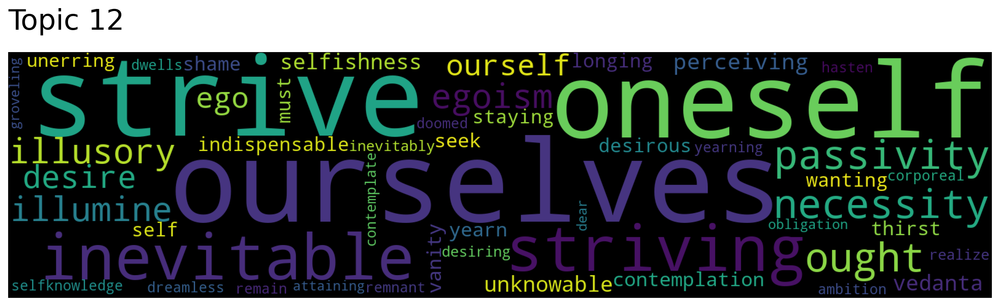

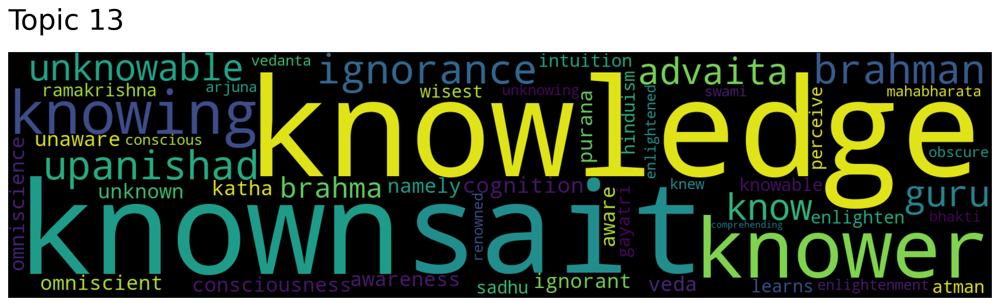

In [24]:
topic_words, word_scores, topic_nums = model.get_topics(14)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

In [25]:
topic_words

array([['brahman', 'brahma', 'advaita', 'upanishad', 'vedanta',
        'hinduism', 'bhakti', 'atman', 'samadhi', 'vishnu', 'acharya',
        'moksha', 'veda', 'swami', 'shiva', 'devas', 'brahmin', 'purana',
        'gita', 'ramakrishna', 'atma', 'formless', 'linga', 'ashram',
        'sadhu', 'hindu', 'prana', 'arjuna', 'vedic', 'agni', 'dharma',
        'gayatri', 'sadhana', 'indra', 'mahabharata', 'katha', 'krishna',
        'sanskrit', 'rudra', 'samsara', 'devotee', 'vivekananda',
        'satya', 'metaphysical', 'godhead', 'satyam', 'dualist', 'caste',
        'kriya', 'kshatriya'],
       ['consciousness', 'conscious', 'unconsciousness', 'awareness',
        'metaphysical', 'unconscious', 'vedanta', 'upanishad', 'dualist',
        'enlightenment', 'samadhi', 'illusion', 'consciously',
        'unknowable', 'perceiving', 'advaita', 'subconscious', 'duality',
        'selfknowledge', 'sentient', 'cognition', 'brahman',
        'perception', 'mysticism', 'ego', 'oneness', 'illusory

In [26]:
get_words(model).shape

(10, 20)

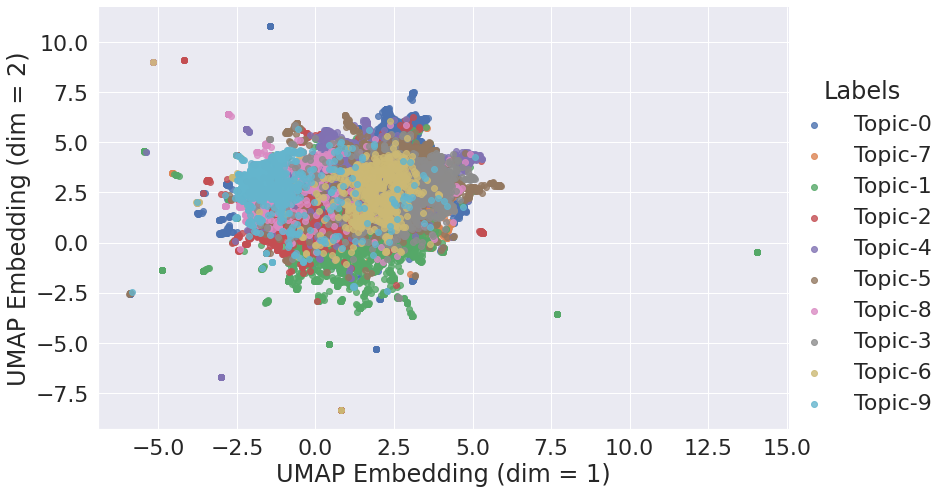

In [ ]:
def plot2d_embeddings(model, num_reduced_topics = 10):
  """
  2d plot the documents embedding
  """
  umap_args = {
    "n_neighbors": 15,
    "n_components": 2, # 5 -> 2 for plotting 
    "metric": "cosine",
    }
  umap_data = umap.UMAP(**umap_args).fit_transform(model._get_document_vectors(norm=False))

  #get dataframe of the result 
  result = pd.DataFrame(umap_data, columns=['x_embeddings', 'y_embeddings'])
  result['labels'] = model.doc_top
  result = pd.DataFrame(umap_data, columns=['UMAP Embedding (dim = 1)', 'UMAP Embedding (dim = 2)'])
  #rename labels
  result['labels'] = np.array( ['Topic-'+ str(x+1) if x != -1 else 'outliers' for x in list(model.doc_top) ] )
  
  #### Hierarchical Topic Reduction ####
  reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_reduced_topics)
  ######################################

  ###get new labels
  new_label = []
  for top_doc in model.doc_top:
    for idx, reduced_list in enumerate(reduced_topic_lists):
      if top_doc in reduced_list:
        new_label.append("Topic-"+str(idx))
        break
  ##################################
  result["Labels"] = np.array(new_label)

  facet = sns.lmplot(data=result, x='UMAP Embedding (dim = 1)', y='UMAP Embedding (dim = 2)', hue='Labels', 
                   fit_reg=False, legend=True, height=7, aspect=1.6)
  sns.set()
  #sns.set(font_scale=2)
  ax = plt.gca()
  #ax.set_title('Visualization of BERT-UMAP embeddings of the topics of the Bhagvad Gita
  plt.savefig('108_upan_sns_bert.png', bbox_inches = 'tight')

  return result

result2d = plot2d_embeddings(model, num_reduced_topics = 10)

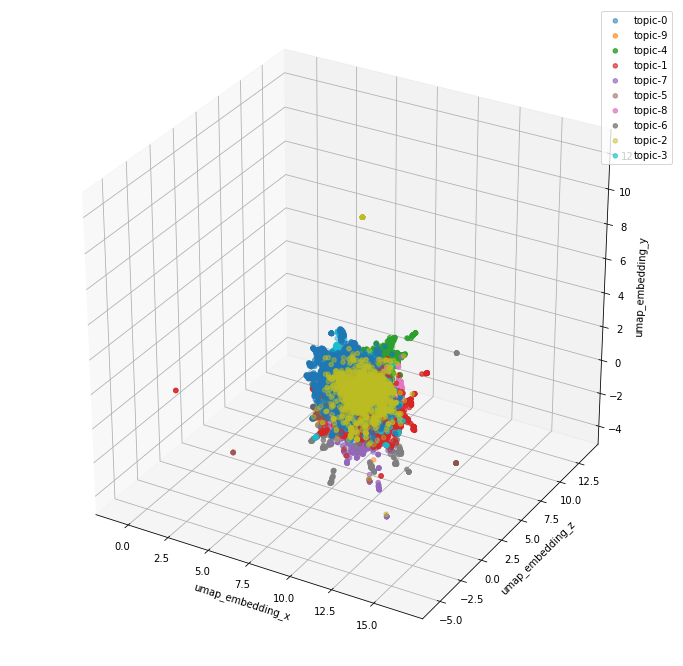

In [ ]:
def plot3d_embeddings(model, num_reduced_topics = 10, img_file_name = '108_upan_3d.png'):
  """
  3d plot the documents embedding
  """
  umap_args = {
    "n_neighbors": 15,
    "n_components": 3, # 5 -> 2 for plotting 
    "metric": "cosine",
    }
  umap_data = umap.UMAP(**umap_args).fit_transform(model._get_document_vectors(norm=False))
  result = pd.DataFrame(umap_data, columns=['x_embeddings', 'y_embeddings', 'z_embeddings'])
  result['labels'] = model.doc_top

  #get dataframe of the result 
  result = pd.DataFrame(umap_data, columns=['umap_embedding_x', 'umap_embedding_y','umap_embedding_z'])
  result['labels'] = np.array( ['topic-'+ str(x+1) if x != -1 else 'outliers' for x in list(model.doc_top) ] )
  #result.head()
  #### Hierarchical Topic Reduction ##########################
  new_label = []
  if model.get_num_topics() > num_reduced_topics:
    reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_reduced_topics)
    ######################################

    ###get new labels
    for top_doc in model.doc_top:
      for idx, reduced_list in enumerate(reduced_topic_lists):
        if top_doc in reduced_list:
          new_label.append("topic-"+str(idx))
          break
    ##################################
    result["reduced_labels"] = np.array(new_label)
  else:
    result["reduced_labels"] = result['labels']
  ##########################################################

  #sns.set(style = "darkgrid")
  fig = plt.figure(figsize=(12,12))
  ax = fig.add_subplot(111, projection='3d')

  x = result['umap_embedding_x']
  y = result['umap_embedding_y']
  z = result['umap_embedding_z']

  ax.set_xlabel('umap_embedding_x')
  ax.set_ylabel('umap_embedding_z')
  ax.set_zlabel('umap_embedding_y')

  for s in result.reduced_labels.unique():
      ax.scatter(z[result.reduced_labels==s],x[result.reduced_labels==s],y[result.reduced_labels==s],label=s)
  plt.savefig(img_file_name)    
  ax.legend()

  return result

result3d = plot3d_embeddings(model, num_reduced_topics = 10)

In [ ]:
df = px.data.tips()
df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [ ]:
import plotly.express as px
#df = px.data.iris()
fig = px.scatter_3d(result3d, x='umap_embedding_x', y='umap_embedding_y', z='umap_embedding_z',
              color='reduced_labels', labels={"reduced_labels": "labels"},
              category_orders={"reduced_labels": ["topic-0", "topic-1", "topic-2", "topic-3","topic-4",
                                                  "topic-5", "topic-6", "topic-7", "topic-8","topic-9"]}
              )
fig.show()

In [ ]:
fig.write_image('108_upan_random123.png', engine="kaleido")

In [ ]:
def plot3d_embeddings_plotly(model, num_reduced_topics = 10):
  """
  3d plot the documents embedding
  """
  umap_args = {
    "n_neighbors": 15,
    "n_components": 3, # 5 -> 2 for plotting 
    "metric": "cosine",
    }
  umap_data = umap.UMAP(**umap_args).fit_transform(model._get_document_vectors(norm=False))
  result = pd.DataFrame(umap_data, columns=['x_embeddings', 'y_embeddings', 'z_embeddings'])
  result['labels'] = model.doc_top

  #get dataframe of the result 
  result = pd.DataFrame(umap_data, columns=['umap_embedding_x', 'umap_embedding_y','umap_embedding_z'])
  result['labels'] = np.array( ['topic-'+ str(x+1) if x != -1 else 'outliers' for x in list(model.doc_top) ] )
  #result.head()
  #### Hierarchical Topic Reduction ####
  reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_reduced_topics)
  ######################################

  ###get new labels
  new_label = []
  for top_doc in model.doc_top:
    for idx, reduced_list in enumerate(reduced_topic_lists):
      if top_doc in reduced_list:
        new_label.append("topic-"+str(idx))
        break
  ##################################
  result["reduced_labels"] = np.array(new_label)

  fig = px.scatter_3d(result3d, x='umap_embedding_x', y='umap_embedding_y', z='umap_embedding_z',
              color='reduced_labels', labels={"reduced_labels": "labels"},
              category_orders={"reduced_labels": ["topic-0", "topic-1", "topic-2", "topic-3","topic-4",
                                                  "topic-5", "topic-6", "topic-7", "topic-8","topic-9"]}
                      )
  fig.show()
  fig.write_image('108_upan_3d_plotly.png', engine="kaleido")    
  # ax.legend()
  
  return result,fig

result3d, fig = plot3d_embeddings_plotly(model, num_reduced_topics = 10)

In [ ]:
def plot2d_embeddings_plotly(model, num_reduced_topics = 10, img_file_name = '108_upan_2d_plotly.png'):
  """
  2d plot the documents embedding
  """
  umap_args = {
    "n_neighbors": 15,
    "n_components": 2, # 5 -> 2 for plotting 
    "metric": "cosine",
    }
  umap_data = umap.UMAP(**umap_args).fit_transform(model._get_document_vectors(norm=False))

  #get dataframe of the result 
  result = pd.DataFrame(umap_data, columns=['x_embeddings', 'y_embeddings'])
  result['labels'] = model.doc_top
  result = pd.DataFrame(umap_data, columns=['umap_embedding_x', 'umap_embedding_y'])
  #rename labels
  result['labels'] = np.array( ['topic-'+ str(x+1) if x != -1 else 'outliers' for x in list(model.doc_top) ] )
  
  #### Hierarchical Topic Reduction ####
  new_label = []
  if model.get_num_topics() > num_reduced_topics:
    reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_reduced_topics)
    ######################################

    ###get new labels
    for top_doc in model.doc_top:
      for idx, reduced_list in enumerate(reduced_topic_lists):
        if top_doc in reduced_list:
          new_label.append("topic-"+str(idx))
          break
    ##################################
    result["reduced_labels"] = np.array(new_label)
  else:
    result["reduced_labels"] = result['labels']

  fig = px.scatter(result, x='umap_embedding_x', y='umap_embedding_y',
                     color='reduced_labels', labels={"reduced_labels": "labels"},
                     category_orders={"reduced_labels": ["topic-0", "topic-1", "topic-2", "topic-3","topic-4",
                                                  "topic-5", "topic-6", "topic-7", "topic-8","topic-9"]}
  )
  fig.show()
  fig.write_image(img_file_name, engine="kaleido")    
  # ax.legend()
  
  return result,fig

result2d, fig2d = plot2d_embeddings_plotly(model, num_reduced_topics = 10)

In [ ]:
correction = {'Atharva-Veda':{'Mundaka':'Munda', 'Atahrvasiras':'Atahrvasirah',
                      'Ramatapini': 'Ramatapani', 'Pasupatabrahmana':'Pasupata',
                      'Bhasmajabala':'Bhasma'},
              'Krishna-Yajur-Veda':{'Kathavalli':'Katha', 'Taittiriyaka':'Taittiri',
                       'Svetasvatara': 'Svetasva', 'Avadhuta':'Avadhutaka',
                       'Yoga-kundalini': 'Yoga-kundali'},
              'Sama-Veda': {'Maitrayani':'Maitrayini','Rudrakshajabala':'Rudraksha'},
              'Sukla-Yajur-Veda': {'Isavasya':'Isa', 'Trisikhibrahmana':'Trisikhi'}
              }
def get_upan_for_vedas(data, vedas_name = 'Atharva-Veda'):
  # map_veda_to_upanishads = veda_to_upanishads(data)
  upan_list = veda_to_upanishads[vedas_name]
  cleaned_upanishads = get_cleaned_data_dict(data)
  veda_upanishads = []
  for idx, name in enumerate(upan_list):
    if vedas_name in correction.keys():
      if name in correction[vedas_name].keys():
        name = correction[vedas_name][name]
    veda_upanishads.append(cleaned_upanishads[name])
  veda_upanishads_ = "\n".join(veda_upanishads)
  return veda_upanishads_

In [ ]:
atharva_upanishads = get_upan_for_vedas(data, vedas_name = 'Atharva-Veda')
len(atharva_upanishads.split('\n'))

6196

In [ ]:
rig_upanishads = get_upan_for_vedas(data, vedas_name = 'Rig-Veda')
sama_upanishads = get_upan_for_vedas(data, vedas_name = 'Sama-Veda')
krishana_upanishads = get_upan_for_vedas(data, vedas_name = 'Krishna-Yajur-Veda')
sukla_upanishads = get_upan_for_vedas(data, vedas_name = 'Sukla-Yajur-Veda')

In [ ]:
print(len(rig_upanishads.split('\n')),len(sama_upanishads.split('\n') ) )

1355 4798


In [ ]:
print(len(krishana_upanishads.split('\n')),len(sukla_upanishads.split('\n') ) )

7011 5151


In [ ]:
def plot2d_embeddings_plotly(model, num_reduced_topics = 10, img_file_name = '108_upan_2d_plotly.png'):
  """
  2d plot the documents embedding
  """
  umap_args = {
    "n_neighbors": 15,
    "n_components": 2, # 5 -> 2 for plotting 
    "metric": "cosine",
    }
  umap_data = umap.UMAP(**umap_args).fit_transform(model._get_document_vectors(norm=False))

  #get dataframe of the result 
  result = pd.DataFrame(umap_data, columns=['x_embeddings', 'y_embeddings'])
  result['labels'] = model.doc_top
  result = pd.DataFrame(umap_data, columns=['umap_embedding_x', 'umap_embedding_y'])
  #rename labels
  result['labels'] = np.array( ['topic-'+ str(x+1) if x != -1 else 'outliers' for x in list(model.doc_top) ] )
  
  #### Hierarchical Topic Reduction ##########################
  new_label = []
  if model.get_num_topics() > num_reduced_topics:
    reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_reduced_topics)
    ######################################

    ###get new labels
    for top_doc in model.doc_top:
      for idx, reduced_list in enumerate(reduced_topic_lists):
        if top_doc in reduced_list:
          new_label.append("topic-"+str(idx))
          break
    ##################################
    result["reduced_labels"] = np.array(new_label)
  else:
    result["reduced_labels"] = result['labels']
  ##########################################################
  fig = px.scatter(result, x='umap_embedding_x', y='umap_embedding_y',
                     color='reduced_labels', labels={"reduced_labels": "labels"},
                     category_orders={"reduced_labels": ["topic-0", "topic-1", "topic-2", "topic-3","topic-4",
                                                  "topic-5", "topic-6", "topic-7", "topic-8","topic-9"]}
  )
  fig.show()
  fig.write_image(img_file_name, engine="kaleido")    
  # ax.legend()
  
  return result,fig

In [ ]:
model_ath, _,_ = get_topics_model(atharva_upanishads.split('\n'), embedding_model='universal-sentence-encoder', num_topics = 10)

2021-08-16 02:58:42,100 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2021-08-16 02:58:42,584 - top2vec - INFO - Downloading universal-sentence-encoder model
INFO:top2vec:Downloading universal-sentence-encoder model
2021-08-16 02:58:49,400 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2021-08-16 02:58:51,571 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2021-08-16 02:59:09,985 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2021-08-16 02:59:10,291 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [ ]:
#model, _,_ = get_topics_model(atharva_upanishads.split('\n'), embedding_model='universal-sentence-encoder', num_topics = 10)
result,fig = plot2d_embeddings_plotly(model_ath,10, 'atharava_veda_bert.png')

In [ ]:
def plot3d_embeddings_plotly(model, num_reduced_topics = 10, img_file_name = '108_upan_3d_plotly.png'):
  """
  3d plot the documents embedding
  """
  umap_args = {
    "n_neighbors": 15,
    "n_components": 3, # 5 -> 2 for plotting 
    "metric": "cosine",
    }
  umap_data = umap.UMAP(**umap_args).fit_transform(model._get_document_vectors(norm=False))
  result = pd.DataFrame(umap_data, columns=['x_embeddings', 'y_embeddings', 'z_embeddings'])
  result['labels'] = model.doc_top

  #get dataframe of the result 
  result = pd.DataFrame(umap_data, columns=['umap_embedding_x', 'umap_embedding_y','umap_embedding_z'])
  result['labels'] = np.array( ['topic-'+ str(x+1) if x != -1 else 'outliers' for x in list(model.doc_top) ] )

  #### Hierarchical Topic Reduction ##########################
  new_label = []
  if model.get_num_topics() > num_reduced_topics:
    reduced_topic_lists = model.hierarchical_topic_reduction(num_topics = num_reduced_topics)
    ######################################

    ###get new labels
    for top_doc in model.doc_top:
      for idx, reduced_list in enumerate(reduced_topic_lists):
        if top_doc in reduced_list:
          new_label.append("topic-"+str(idx))
          break
    ##################################
    result["reduced_labels"] = np.array(new_label)
  else:
    result["reduced_labels"] = result['labels']
  ##########################################################

  fig = px.scatter_3d(result3d, x='umap_embedding_x', y='umap_embedding_y', z='umap_embedding_z',
              color='reduced_labels', labels={"reduced_labels": "labels"},
              category_orders={"reduced_labels": ["topic-0", "topic-1", "topic-2", "topic-3","topic-4",
                                                  "topic-5", "topic-6", "topic-7", "topic-8","topic-9"]}
                      )
  fig.show()
  fig.write_image(img_file_name, engine="kaleido")    
  # ax.legend()
  
  return result,fig

result3d, fig = plot3d_embeddings_plotly(model_ath, 10, 'atharva_veda_bert_3d.png')

In [ ]:
model_rig, _,_ = get_topics_model(rig_upanishads.split('\n'), embedding_model='universal-sentence-encoder', num_topics = 10)